# Fashion MNIST dataset, an alternative to MNIST

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense, Flatten, Dropout, BatchNormalization

In [3]:
# Import dataset
fashion_mnist = keras.datasets.fashion_mnist

In [4]:
fashion_mnist

<module 'keras.api._v2.keras.datasets.fashion_mnist' from '/usr/local/lib/python3.9/dist-packages/keras/api/_v2/keras/datasets/fashion_mnist/__init__.py'>

In [5]:
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

4422102/4422102 [==============================] - 0s 0us/step


In [6]:
(train_images.shape, train_labels.shape), (test_images.shape, test_labels.shape)

(((60000, 28, 28), (60000,)), ((10000, 28, 28), (10000,)))

In [7]:
class_name = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress' , 'Coat', 'Sandal', 
              'Shirt' , 'Sneaker' , 'Bag' , 'Ankle boot']

In [8]:
class_name

['T-shirt/top',
 'Trouser',
 'Pullover',
 'Dress',
 'Coat',
 'Sandal',
 'Shirt',
 'Sneaker',
 'Bag',
 'Ankle boot']

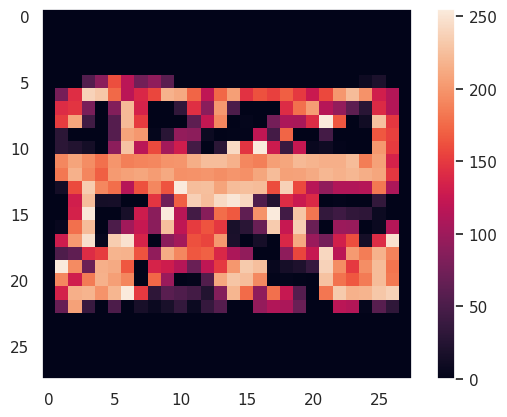

In [11]:
plt.figure()
plt.imshow(train_images[10000])
plt.colorbar()
plt.grid(False)
plt.show()

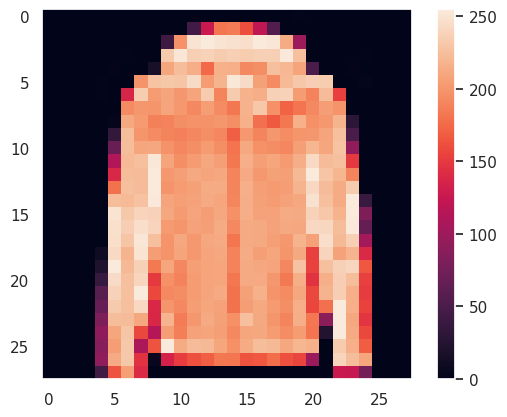

In [12]:
plt.figure()
plt.imshow(train_images[5000])
plt.colorbar()
plt.grid(False)
plt.show()

In [13]:
# Data Normalization - Mandatory Steps
train_images = train_images / 255.0
test_images = test_images/255.0

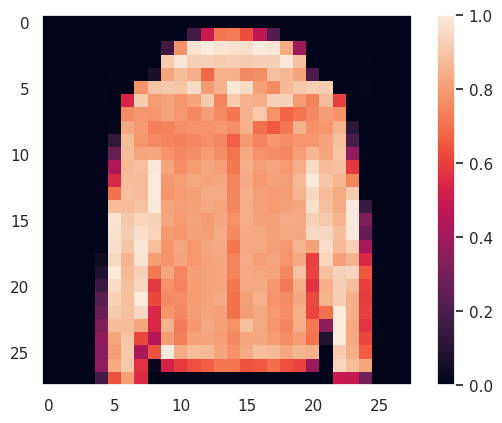

In [14]:
plt.figure()
plt.imshow(train_images[5000])
plt.colorbar()
plt.grid(False)
plt.show()

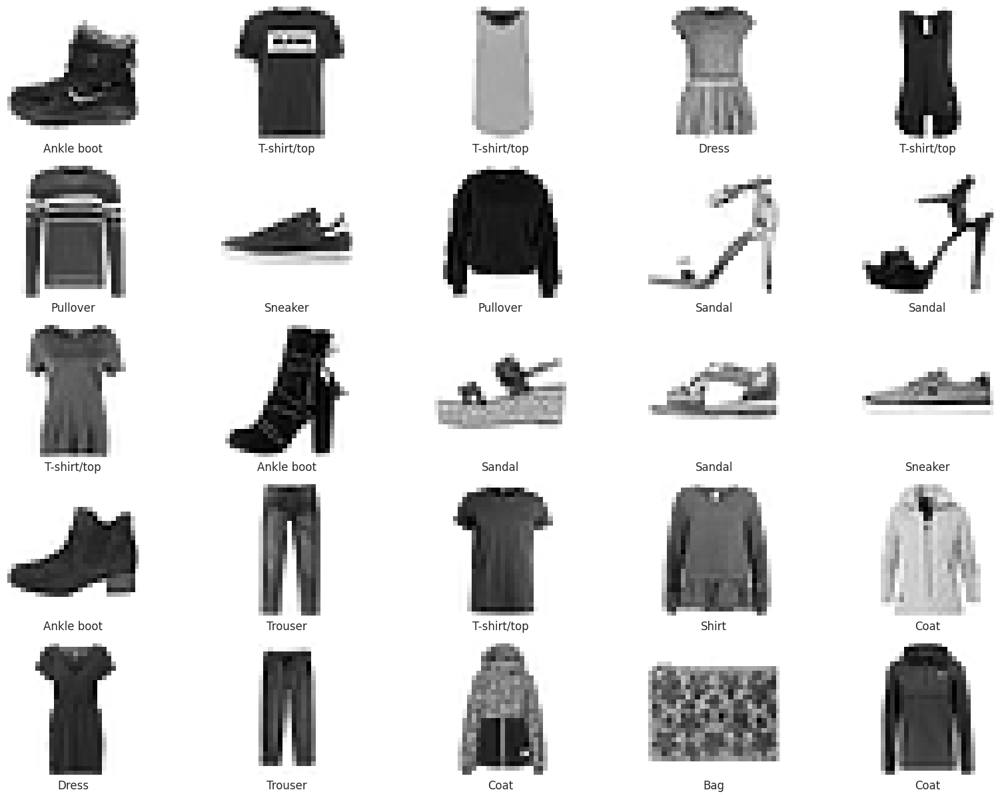

In [15]:
plt.figure(figsize=(20,15))
for i in range(25):
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(True)
  plt.imshow(train_images[i], cmap=plt.cm.binary)
  plt.xlabel(class_name[train_labels[i]])

plt.show()

# MultiLayer Perceptron Model

In [17]:
tf.random.set_seed(100)
tf.keras.backend.clear_session()
model = None


model = keras.Sequential([
    keras.layers.Flatten(input_shape=(28,28)),
    keras.layers.Dense(128, activation = 'relu', kernel_initializer='he_normal',kernel_regularizer = keras.regularizers.l2(0.01)),
    keras.layers.Dropout(0.25),
    keras.layers.BatchNormalization(),
    keras.layers.Dense(128, activation = 'relu', kernel_initializer='he_normal',kernel_regularizer = keras.regularizers.l2(0.01)),
    keras.layers.Dropout(0.25),
    keras.layers.BatchNormalization(),
    keras.layers.Dense(10, activation = 'softmax') 

])



In [22]:
128*10+10

1290

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 128)               100480    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                        

In [23]:
model.compile(optimizer='adam', loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

In [24]:
# Visualization - TensorBoard
import os
import datetime
logdir = os.path.join('logs', datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
print(logdir)

logs/20230410-034312


In [28]:
%load_ext tensorboard 
%tensorboard --logdir $logdir

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 15326), started 0:18:14 ago. (Use '!kill 15326' to kill it.)

<IPython.core.display.Javascript object>

In [26]:
tensorboard_callback = keras.callbacks.TensorBoard(logdir, histogram_freq =1)

In [27]:
model.fit(train_images, train_labels, validation_data=(test_images, test_labels), epochs=100, callbacks=[tensorboard_callback])

Epoch 1/100
1875/1875 [==============================] - 15s 4ms/step - loss: 1.6446 - accuracy: 0.7333 - val_loss: 0.7586 - val_accuracy: 0.7892
Epoch 2/100
1875/1875 [==============================] - 8s 4ms/step - loss: 0.8498 - accuracy: 0.7513 - val_loss: 0.7262 - val_accuracy: 0.7757
Epoch 3/100
1875/1875 [==============================] - 8s 5ms/step - loss: 0.8049 - accuracy: 0.7562 - val_loss: 0.6772 - val_accuracy: 0.8074
Epoch 4/100
1875/1875 [==============================] - 8s 4ms/step - loss: 0.7990 - accuracy: 0.7538 - val_loss: 0.6764 - val_accuracy: 0.8024
Epoch 5/100
1875/1875 [==============================] - 9s 5ms/step - loss: 0.7858 - accuracy: 0.7593 - val_loss: 0.7123 - val_accuracy: 0.7912
Epoch 6/100
1875/1875 [==============================] - 8s 5ms/step - loss: 0.7943 - accuracy: 0.7593 - val_loss: 0.6995 - val_accuracy: 0.7931
Epoch 7/100
1875/1875 [==============================] - 8s 4ms/step - loss: 0.7918 - accuracy: 0.7553 - val_loss: 0.7916 - val_a

# Final Model - without using below parameter
# Parameters - 
## Dropout
## Regularization
## Batch Normalization
## Weight Initialization
## Callbacks - early Stopping

In [29]:
model_1 = keras.Sequential([
    keras.layers.Flatten(input_shape=(28,28)),
    keras.layers.Dense(128, activation = 'relu'),
    keras.layers.Dense(10, activation = 'softmax') 

])

In [ ]:
model_1.compile(optimizer='adam', loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
model_1.fit(train_images, train_labels, validation_data=(test_images, test_labels), epochs=100)

Epoch 1/100
1875/1875 [==============================] - 7s 3ms/step - loss: 0.4959 - accuracy: 0.8250 - val_loss: 0.4335 - val_accuracy: 0.8383
Epoch 2/100
1875/1875 [==============================] - 5s 3ms/step - loss: 0.3755 - accuracy: 0.8645 - val_loss: 0.3891 - val_accuracy: 0.8627
Epoch 3/100
1875/1875 [==============================] - 6s 3ms/step - loss: 0.3356 - accuracy: 0.8775 - val_loss: 0.3574 - val_accuracy: 0.8737
Epoch 4/100
1875/1875 [==============================] - 5s 3ms/step - loss: 0.3115 - accuracy: 0.8858 - val_loss: 0.3612 - val_accuracy: 0.8730
Epoch 5/100
1875/1875 [==============================] - 5s 3ms/step - loss: 0.2920 - accuracy: 0.8912 - val_loss: 0.3588 - val_accuracy: 0.8740
Epoch 6/100
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2813 - accuracy: 0.8963 - val_loss: 0.3553 - val_accuracy: 0.8731
Epoch 7/100
1875/1875 [==============================] - 5s 3ms/step - loss: 0.2665 - accuracy: 0.9016 - val_loss: 0.3412 - val_ac

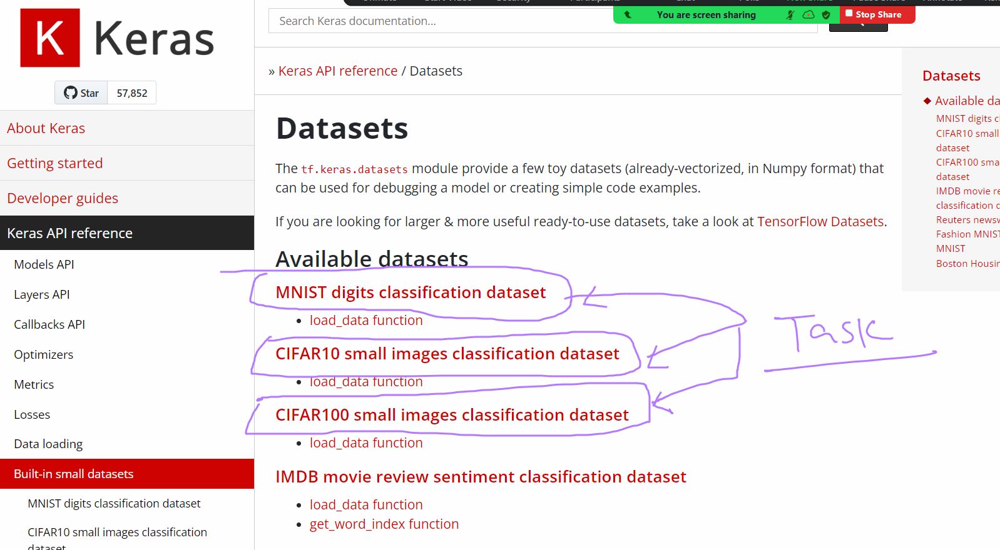